<a href="https://colab.research.google.com/github/alhamhotaki/EDA_Real-Estate-Data/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Overview of the Dataset

In [2]:
import pandas as pd
import numpy as np
file_path = '/content/drive/MyDrive/Colab Notebooks/raw_house_data.csv'
house_data = pd.read_csv(file_path)

In [3]:
house_data.head()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA
0,21530491,5300000.0,85637,-110.378200,31.356362,2154.00,5272.00,1941,13,10.0,10500.0,0.0,"Dishwasher, Freezer, Refrigerator, Oven",6,"Mexican Tile, Wood",0
1,21529082,4200000.0,85646,-111.045371,31.594213,1707.00,10422.36,1997,2,2.0,7300.0,0.0,"Dishwasher, Garbage Disposal",5,"Natural Stone, Other",0
2,3054672,4200000.0,85646,-111.040707,31.594844,1707.00,10482.00,1997,2,3.0,NaN,NaN,"Dishwasher, Garbage Disposal, Refrigerator",5,"Natural Stone, Other: Rock",NaN
3,21919321,4500000.0,85646,-111.035925,31.645878,636.67,8418.58,1930,7,5.0,9019.0,4.0,"Dishwasher, Double Sink, Pantry: Butler, Refri...",4,"Ceramic Tile, Laminate, Wood",NaN
4,21306357,3411450.0,85750,-110.813768,32.285162,3.21,15393.00,1995,4,6.0,6396.0,3.0,"Dishwasher, Garbage Disposal, Refrigerator, Mi...",5,"Carpet, Concrete",55


In [4]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MLS               5000 non-null   int64  
 1   sold_price        5000 non-null   float64
 2   zipcode           5000 non-null   int64  
 3   longitude         5000 non-null   float64
 4   latitude          5000 non-null   float64
 5   lot_acres         4990 non-null   float64
 6   taxes             5000 non-null   float64
 7   year_built        5000 non-null   int64  
 8   bedrooms          5000 non-null   int64  
 9   bathrooms         4994 non-null   float64
 10  sqrt_ft           4944 non-null   float64
 11  garage            4993 non-null   float64
 12  kitchen_features  4967 non-null   object 
 13  fireplaces        5000 non-null   object 
 14  floor_covering    4999 non-null   object 
 15  HOA               4438 non-null   object 
dtypes: float64(8), int64(4), object(4)
memory 

In [5]:
house_data.describe()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage
count,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,4990.000000,5.000000e+03,5000.00000,5000.000000,4994.000000,4944.000000,4993.000000
mean,2.127070e+07,7.746262e+05,85723.025600,-110.912107,32.308512,4.661317,9.402828e+03,1992.32800,3.933800,3.829896,3716.366828,2.816143
std,2.398508e+06,3.185556e+05,38.061712,0.120629,0.178028,51.685230,1.729385e+05,65.48614,1.245362,1.387063,1120.683515,1.192946
min,3.042851e+06,1.690000e+05,85118.000000,-112.520168,31.356362,0.000000,0.000000e+00,0.00000,1.000000,1.000000,1100.000000,0.000000
25%,2.140718e+07,5.850000e+05,85718.000000,-110.979260,32.277484,0.580000,4.803605e+03,1987.00000,3.000000,3.000000,3047.000000,2.000000
50%,2.161469e+07,6.750000e+05,85737.000000,-110.923420,32.318517,0.990000,6.223760e+03,1999.00000,4.000000,4.000000,3512.000000,3.000000
75%,2.180480e+07,8.350000e+05,85749.000000,-110.859078,32.394334,1.757500,8.082830e+03,2006.00000,4.000000,4.000000,4130.250000,3.000000
max,2.192856e+07,5.300000e+06,86323.000000,-109.454637,34.927884,2154.000000,1.221508e+07,2019.00000,36.000000,36.000000,22408.000000,30.000000


In [6]:
house_data.isnull().sum()

,0
MLS,0
sold_price,0
zipcode,0
longitude,0
latitude,0
lot_acres,10
taxes,0
year_built,0
bedrooms,0
bathrooms,6


The dataset contains 5,000 entries and 16 columns. Here is a summary of the dataset:

## Columns Overview:


*   MLS: Unique identifier for each house (int).
*   sold_price: The selling price of the house (float).
*   zipcode: ZIP code of the property location (int).
*   longitude: Longitude of the property (float).
*   latitude: Latitude of the property (float).
*   lot_acres: Size of the lot in acres (float, but with some missing values).
*   taxes: Annual property taxes (float).
*   year_built: Year the house was built (int).
*   bedrooms: Number of bedrooms (int).
*   bathrooms: Number of bathrooms (float).
*   sqrt_ft: Square footage of the house (float, contains "None" which should be handled).
*   garage: Number of garage spaces (float, similar issue as above).
*   kitchen_features: Kitchen features listed as a comma-separated string (object).
*   fireplaces: Number of fireplaces (object, needs conversion to numeric).
*   floor_covering: Types of floor covering, listed as a comma-separated string (object).
*   HOA: Homeowners Association fee (object, needs conversion to numeric).

## Initial Observations:
1. Data Types: Several columns need type conversions.
2. Missing Values: columns such as lot acres, square footage, garage, kitchen features and HOA should be handled.
3. Potential Outliers: Columns like lot_acres show extreme values, suggesting potential outliers (e.g., maximum of 2154 acres).
4. Categorical Features: The kitchen_features and floor_covering columns contain multiple values as comma-separated strings, which might need encoding.

# Converting Data Types

In [7]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MLS               5000 non-null   int64  
 1   sold_price        5000 non-null   float64
 2   zipcode           5000 non-null   int64  
 3   longitude         5000 non-null   float64
 4   latitude          5000 non-null   float64
 5   lot_acres         4990 non-null   float64
 6   taxes             5000 non-null   float64
 7   year_built        5000 non-null   int64  
 8   bedrooms          5000 non-null   int64  
 9   bathrooms         4994 non-null   float64
 10  sqrt_ft           4944 non-null   float64
 11  garage            4993 non-null   float64
 12  kitchen_features  4967 non-null   object 
 13  fireplaces        5000 non-null   object 
 14  floor_covering    4999 non-null   object 
 15  HOA               4438 non-null   object 
dtypes: float64(8), int64(4), object(4)
memory 

1. **Zipcodes** are categorical and should be treated as strings rather than integers to avoid unintended numerical operations.

In [8]:
house_data['zipcode'] = house_data['zipcode'].astype(str)

2. **Year Built**: Although already an integer, it should be represented as a date type specifically as a year.

In [9]:
house_data['year_built'] = house_data['year_built'].replace(0, np.nan)

house_data['year_built'] = pd.to_datetime(house_data['year_built'], format='%Y').dt.year


3. **Fireplaces**: They are indicating the number of fireplaces in each house. The proper data type would be ineger rather than string.

In [10]:
house_data['fireplaces'] = house_data['fireplaces'].replace(' ', np.nan)

house_data['fireplaces'] = house_data['fireplaces'].astype('Int64')

4. **HOA**: Home Owners Association Fee should be numeric value rather than being a string.


In [11]:
house_data['HOA'] = house_data['HOA'].replace('None', np.nan).str.replace(',', '').astype(float)

In [12]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MLS               5000 non-null   int64  
 1   sold_price        5000 non-null   float64
 2   zipcode           5000 non-null   object 
 3   longitude         5000 non-null   float64
 4   latitude          5000 non-null   float64
 5   lot_acres         4990 non-null   float64
 6   taxes             5000 non-null   float64
 7   year_built        4995 non-null   float64
 8   bedrooms          5000 non-null   int64  
 9   bathrooms         4994 non-null   float64
 10  sqrt_ft           4944 non-null   float64
 11  garage            4993 non-null   float64
 12  kitchen_features  4967 non-null   object 
 13  fireplaces        4975 non-null   Int64  
 14  floor_covering    4999 non-null   object 
 15  HOA               4438 non-null   float64
dtypes: Int64(1), float64(10), int64(2), object

# Data Validation

To validate the data, we need to check for logical consistency across various columns. This involves ensuring that the values make sense in the context of the data and that there are no contradictions or anomalies.

1. **Year Built**:
Ensure that the year_built values are reasonable (e.g., no future years, no years that are too early, and no zero values).

2. **Bedrooms, Bathrooms, and Square Footage:**
Validate that the number of bedrooms and bathrooms is reasonable.
We will check that the square footage (sqrt_ft) is consistent with the number of rooms (e.g., no homes with more bedrooms than square footage).

3. **Lot Acres**:
Ensure that the lot_acres values are within a realistic range for residential properties.

4. **Taxes**:
Validate that the taxes correlate logically with the property value and location (e.g., no zero or negative taxes unless justified).

5. **Fireplaces**:
Ensure the number of fireplaces is reasonable (e.g., no negative numbers).

6. **HOA Fees**:
Validate that HOA fees are reasonable and correlate with the types of properties (e.g., no negative fees).

In [13]:
# We will identify and counts invalid data entries in a real estate dataset. Specifically, it checks for:
# - Invalid year built values (future dates or before 1800)
# - Invalid room counts or square footage (zero or negative values)
# - Invalid lot sizes (zero, negative, or extremely large values)
# - Invalid number of fireplaces (negative or unreasonably high values)
# - Invalid HOA fees (negative values)
# Finally, it summarizes how many invalid entries are found for each issue.

invalid_year_built = house_data[(house_data['year_built'] > pd.Timestamp.now().year) | (house_data['year_built'] < 1800)]
invalid_rooms = house_data[(house_data['bedrooms'] <= 0) | (house_data['bathrooms'] <= 0) | (house_data['sqrt_ft'] <= 0)]
invalid_lot_acres = house_data[(house_data['lot_acres'] <= 0) | (house_data['lot_acres'] > 1000)]
invalid_fireplaces = house_data[(house_data['fireplaces'] < 0) | (house_data['fireplaces'] > 10)]
invalid_hoa = house_data[(house_data['HOA'] < 0)]

issues = {
    "Invalid Year Built": invalid_year_built,
    "Invalid Rooms or Square Footage": invalid_rooms,
    "Invalid Lot Acres": invalid_lot_acres,
    "Invalid Fireplaces": invalid_fireplaces,
    "Invalid HOA": invalid_hoa
}
issue_counts = {key: len(value) for key, value in issues.items()}
issue_counts

{'Invalid Year Built': 0,
 'Invalid Rooms or Square Footage': 0,
 'Invalid Lot Acres': 39,
 'Invalid Fireplaces': 0,
 'Invalid HOA': 0}

In [14]:
house_data.loc[(house_data['lot_acres'] <= 0) | (house_data['lot_acres'] > 1000), 'lot_acres'] = np.nan

# Handling Missing Values

In [15]:
house_data.isna().sum()

,0
MLS,0
sold_price,0
zipcode,0
longitude,0
latitude,0
lot_acres,49
taxes,0
year_built,5
bedrooms,0
bathrooms,6


1. **Lot Acres**: This column has 49 missing values. As we know, there would be other features affecting the lot size such as zip code (location), sold price, number of bedrooms and others.
For this column, we can have different impuation strategies:    
  * Group-Based Imputation: Median or Mean by Group: Calculate the median or mean lot_acres within each group defined by zipcode, bedrooms, and/or sold_price bins, and use this value to impute missing data.
  * K-Nearest Neighbors (KNN) Imputation: Find the k-nearest neighbors for each record with missing lot_acres based on the features sold_price, bedrooms, and zipcode, and impute the missing value with the average lot_acres of these neighbors.
  * Simple Mean/Median Imputation: Impute missing lot_acres values with the overall median or mean of the available lot_acres values, potentially stratified by zipcode or another key feature.

For this dataset, we will be using the first method - Group Based Imputation.

In [16]:
# We will categorize sold prices into bins, calculates the average lot acres by group, and then uses this information to fill in missing lot acre values. Finally, it checks for any remaining missing values.

house_data['sold_price_bin'] = pd.qcut(house_data['sold_price'], q=5, duplicates='drop')
mean_lot_acres_by_group_with_price = house_data.groupby(['zipcode', 'bedrooms', 'sold_price_bin'])['lot_acres'].mean()

def impute_lot_acres_with_price(row):
    if pd.isna(row['lot_acres']):
        return mean_lot_acres_by_group_with_price.get((row['zipcode'], row['bedrooms'], row['sold_price_bin']), np.nan)
    else:
        return row['lot_acres']

house_data['lot_acres'] = house_data.apply(impute_lot_acres_with_price, axis=1)

remaining_nans_after_imputation = house_data[house_data['lot_acres'].isna()]
remaining_nans_after_imputation


<ipython-input-16-d5c9073b5a47>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_lot_acres_by_group_with_price = house_data.groupby(['zipcode', 'bedrooms', 'sold_price_bin'])['lot_acres'].mean()


,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA,sold_price_bin
1,21529082,4200000.0,85646,-111.045371,31.594213,NaN,10422.36,1997.0,2,2.0,7300.0,0.0,"Dishwasher, Garbage Disposal",5,"Natural Stone, Other",0.0,"(900000.0, 5300000.0]"
2,3054672,4200000.0,85646,-111.040707,31.594844,NaN,10482.00,1997.0,2,3.0,NaN,NaN,"Dishwasher, Garbage Disposal, Refrigerator",5,"Natural Stone, Other: Rock",NaN,"(900000.0, 5300000.0]"
29,21424469,2500000.0,85609,-110.095713,32.057222,NaN,2441.60,1985.0,2,2.0,2895.0,0.0,"Refrigerator, Oven",1,"Carpet, Mexican Tile, Other",0.0,"(900000.0, 5300000.0]"
53,21424173,2150000.0,85739,-110.883660,32.509721,NaN,19060.81,2008.0,2,3.0,2729.0,0.0,"Dishwasher, Garbage Disposal, Refrigerator, Mi...",2,"Natural Stone, Wood",20000.0,"(900000.0, 5300000.0]"
176,21216789,1495000.0,85716,-110.922995,32.224182,NaN,5747.29,1968.0,6,6.0,4620.0,2.0,"Dishwasher, Garbage Disposal, Refrigerator, Mi...",4,Mexican Tile,0.0,"(900000.0, 5300000.0]"


In [17]:
# We will categorize sold prices into bins, calculates the average lot acres by bedrooms and price bin, and then uses this information to fill in missing lot acre values. Finally, it checks for any remaining missing values.


house_data['sold_price_bin'] = pd.qcut(house_data['sold_price'], q=5, duplicates='drop')
mean_lot_acres_by_group_with_price = house_data.groupby(['bedrooms', 'sold_price_bin'])['lot_acres'].mean()

def impute_lot_acres_with_price(row):
    if pd.isna(row['lot_acres']):
        return mean_lot_acres_by_group_with_price.get((row['bedrooms'], row['sold_price_bin']), np.nan)
    else:
        return row['lot_acres']

house_data['lot_acres'] = house_data.apply(impute_lot_acres_with_price, axis=1)

remaining_nans_after_imputation = house_data[house_data['lot_acres'].isna()]
remaining_nans_after_imputation


<ipython-input-17-aad8fc0a9710>:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_lot_acres_by_group_with_price = house_data.groupby(['bedrooms', 'sold_price_bin'])['lot_acres'].mean()


,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA,sold_price_bin


In [18]:
house_data.lot_acres.describe()

,lot_acres
count,5000.000000
mean,3.385776
std,19.159389
min,0.020000
25%,0.590000
50%,1.000000
75%,1.780000
max,636.670000


2. **Year Built:** There are five missing values in year built column. We will be using the same method as we used for the lot acres column. We will group by the dataset by zipcode (location) and sold price for which the year built is playing a key role. For this column we will be using the median method.


In [19]:
house_data.loc[house_data.year_built.isna()]

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA,sold_price_bin
35,21307177,2495000.0,85637,-110.740635,31.720431,131.00,1220.32,NaN,13,15.0,13000.0,0.0,"Compactor, Dishwasher, Freezer, Garbage Dispos...",4,"Carpet, Ceramic Tile, Mexican Tile",0.0,"(900000.0, 5300000.0]"
162,21207587,1210520.0,85658,-111.101588,32.468488,0.33,1412.75,NaN,4,5.0,3334.0,2.0,"Dishwasher, Refrigerator, Microwave, Oven",3,"Carpet, Natural Stone, Wood",550.0,"(900000.0, 5300000.0]"
946,21608590,695000.0,85645,-111.183593,31.702330,72.00,2480.58,NaN,4,4.0,2272.0,2.0,"Dishwasher, Refrigerator, Oven",2,Ceramic Tile,0.0,"(635000.0, 727000.0]"
1438,21702126,877170.0,85755,-110.977158,32.459429,0.60,2005.57,NaN,3,4.0,3078.0,3.0,"Dishwasher, Garbage Disposal, Microwave, Oven",0,Other,167.0,"(727000.0, 900000.0]"
1767,21719857,700000.0,85701,-110.963672,32.216996,0.13,7059.56,NaN,3,3.0,2500.0,3.0,"Dishwasher, Electric Range, Garbage Disposal, ...",0,Other: Recycled Porcelain,74.0,"(635000.0, 727000.0]"


In [20]:
# We will calculate the median year built by zipcode and price bin, uses it to fill in missing year built values, rounds the imputed values, and checks for any remaining missing values.

median_year_built_by_group = house_data.groupby(['zipcode', 'sold_price_bin'])['year_built'].median()

def impute_year_built(row):
    if pd.isna(row['year_built']):
        return median_year_built_by_group.get((row['zipcode'], row['sold_price_bin']), np.nan)
    else:
        return row['year_built']


house_data['year_built'] = house_data.apply(impute_year_built, axis=1)
house_data['year_built'] = house_data['year_built'].round().astype(np.int64)

missing_values_after_imputation = house_data['year_built'].isna().sum()
missing_values_after_imputation


<ipython-input-20-a4bc80035f92>:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_year_built_by_group = house_data.groupby(['zipcode', 'sold_price_bin'])['year_built'].median()


0

In [21]:
house_data.year_built.describe()

,year_built
count,5000.000000
mean,1994.302600
std,17.776204
min,1893.000000
25%,1987.000000
50%,1999.000000
75%,2006.000000
max,2019.000000


3. **Bathrooms**: There are 6 missing values in Bathrooms column. We will impute the missing value based on the group imputaion of number of bedrooms, square footage and number of garages.

In [22]:
# We will calculate the mean number of bathrooms by bedrooms and garage, uses this to fill in missing bathroom values, rounds the imputed values, and checks for any remaining missing values.


mean_bathrooms_by_group = house_data.groupby(['bedrooms', 'garage'])['bathrooms'].mean()

def impute_bathrooms(row):
    if pd.isna(row['bathrooms']):
        return mean_bathrooms_by_group.get((row['bedrooms'],  row['garage']), np.nan)
    else:
        return row['bathrooms']

house_data['bathrooms'] = house_data.apply(impute_bathrooms, axis=1)
house_data['bathrooms'] = house_data['bathrooms'].round()

missing_values_bathrooms_final = house_data['bathrooms'].isna().sum()

missing_values_bathrooms_final

0

4. **Square Footage**: In order to impute the missing values in square footage column, we will introduce a new feature which will be the the sum of bedrooms and bathrooms and then group by the new feature and calcuate the average footage square based on the new feature. We will impute the missing values of the square footage column based on this new calcuated average.


In [23]:
# We will create a new feature by adding bedrooms and bathrooms, calculates the mean square footage by this total, uses it to fill in missing square footage values, and checks for any remaining missing values.

house_data['total_bed_bath'] = house_data['bedrooms'] + house_data['bathrooms']
mean_sqrt_ft_by_rooms = house_data.groupby('total_bed_bath')['sqrt_ft'].mean()

def impute_sqrt_ft(row):
    if pd.isna(row['sqrt_ft']):
        return mean_sqrt_ft_by_rooms.get(row['total_bed_bath'], pd.NA)
    else:
        return row['sqrt_ft']

house_data['sqrt_ft'] = house_data.apply(impute_sqrt_ft, axis=1)

missing_values_sqrt_ft_final = house_data['sqrt_ft'].isna().sum()
print(f"Remaining missing values in sqrt_ft: {missing_values_sqrt_ft_final}")

Remaining missing values in sqrt_ft: 0


5. **Garage:** There are 7 missing values in Garage column. In order to find the influencing features on the number of garages in a house, we will conduct a simple correlation calcuation:

In [24]:
correlation_with_garage = house_data[['garage', 'bedrooms', 'bathrooms', 'sqrt_ft', 'sold_price', 'lot_acres', 'year_built', 'taxes']].corr()
correlation_with_garage


,garage,bedrooms,bathrooms,sqrt_ft,sold_price,lot_acres,year_built,taxes
garage,1.000000,0.052618,0.113673,0.180699,0.100528,-0.028060,0.317985,0.005576
bedrooms,0.052618,1.000000,0.686766,0.619467,0.115932,0.105137,-0.185492,0.005259
bathrooms,0.113673,0.686766,1.000000,0.720779,0.326283,0.102710,-0.052153,0.008980
sqrt_ft,0.180699,0.619467,0.720779,1.000000,0.507245,0.116083,-0.067360,0.036963
sold_price,0.100528,0.115932,0.326283,0.507245,1.000000,0.154694,0.096837,0.023326
lot_acres,-0.028060,0.105137,0.102710,0.116083,0.154694,1.000000,-0.121407,-0.000835
year_built,0.317985,-0.185492,-0.052153,-0.067360,0.096837,-0.121407,1.000000,-0.004165
taxes,0.005576,0.005259,0.008980,0.036963,0.023326,-0.000835,-0.004165,1.000000


Correlation Analysis of Garage with other features:

The highest correlation of garage is with year_built (0.318), followed by sqrt_ft (0.181) and bathrooms (0.114).
These correlations suggest that newer homes, larger homes, and homes with more bathrooms are more likely to have more garage spaces.
The correlation with sold_price is relatively low (0.101), indicating that while more expensive homes may have larger garages, it is not a strong predictor.

In [25]:
# This code calculates the median garage size by year built, square footage, and bathrooms, uses this to fill in missing garage values, rounds the imputed values, and checks for any remaining missing values.

median_garage_by_group = house_data.groupby(['year_built', 'sqrt_ft', 'bathrooms'])['garage'].median()

def impute_garage(row):
    if pd.isna(row['garage']):
        return median_garage_by_group.get((row['year_built'], row['sqrt_ft'], row['bathrooms']), pd.NA)
    else:
        return row['garage']


house_data['garage'] = house_data.apply(impute_garage, axis=1).round()


missing_values_garage_final = house_data['garage'].isna().sum()

missing_values_garage_final


6

Fall back imputation:


In [26]:
median_garage_by_year_bath = house_data.groupby(['year_built', 'bathrooms'])['garage'].median()

def fallback_impute_garage(row):
    if pd.isna(row['garage']):
        return median_garage_by_year_bath.get((row['year_built'], row['bathrooms']), pd.NA)
    else:
        return row['garage']


house_data['garage'] = house_data.apply(fallback_impute_garage, axis=1).round()


missing_values_garage_final = house_data['garage'].isna().sum()

print(f"Remaining missing values in garage after fallback: {missing_values_garage_final}")

Remaining missing values in garage after fallback: 0


6. **Kitchen Features:** There are different method for filling a categorical column with multiple strings seperated by comma. One of them is the encoding technique. It starts with label Encoding which Converts each unique kitchen feature into a numeric label. This is suitable if the features are categorical without any intrinsic order. Then one-hot encoding comes in which creates binary columns for each unique kitchen feature, indicating the presence or absence of each feature in a property. However for this specific dataset we will just replace the NaN value with 'No Features Listed'.

In [27]:
house_data['kitchen_features'].fillna('No Features Listed', inplace=True)

house_data.kitchen_features.isna().sum()


0

7. **Fireplaces:** There are 25 NaN values which origianlly were blank with no data. During the data type conversion from object to integer, those blank data points were replaced with NaN values. This actually means that there were no fireplaces for those specific properties.


In [28]:
house_data['fireplaces'].fillna(0, inplace=True)

missing_values_fireplaces_after_fill = house_data['fireplaces'].isna().sum()

missing_values_fireplaces_after_fill


0

8. **Floor Covering:**

In [29]:
house_data['floor_covering'].fillna('No Features Listed', inplace=True)

missing_values_floor_covering_after_fill = house_data['floor_covering'].isna().sum()

missing_values_floor_covering_after_fill


0

9. **Home Owners Association Fee:**

We will utilize K-Nearest Neighbors (KNN) imputation to fill in missing values in the 'HOA' (Homeowners Association) column of the dataset. It begins by selecting relevant features and standardizing them to ensure uniform contribution during the imputation process. The rows with missing 'HOA' values are then isolated, and KNN is applied to predict and fill in these missing values using the relationships between the selected features. The imputed values are integrated back into the dataset, ensuring no negative values, and the code concludes by checking that all missing 'HOA' values have been successfully imputed.

In [30]:
house_data.HOA.isna().sum()

562

In [31]:
house_data.HOA.describe()

,HOA
count,4438.000000
mean,103.043058
std,547.397960
min,0.000000
25%,8.000000
50%,56.000000
75%,135.000000
max,20000.000000


In [32]:
# We will use K-Nearest Neighbors (KNN) to impute missing HOA values. First, it scales relevant features, then applies KNN to estimate missing HOA values, and finally clips any negative values to zero. It also checks for any remaining missing HOA values.


from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
import numpy as np

features_for_knn = house_data[['HOA', 'sold_price', 'year_built', 'bedrooms', 'bathrooms', 'sqrt_ft', 'lot_acres']]


scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_for_knn)

missing_hoa_mask = house_data['HOA'].isna()
features_with_missing_hoa = features_scaled[missing_hoa_mask]


knn_imputer = KNNImputer(n_neighbors=5)
features_imputed = knn_imputer.fit_transform(features_with_missing_hoa)


house_data.loc[missing_hoa_mask, 'HOA'] = features_imputed[:, 0]


house_data['HOA'] = house_data['HOA'].clip(lower=0)

missing_values_hoa_after_knn = house_data['HOA'].isna().sum()
print(f"Remaining missing values in HOA: {missing_values_hoa_after_knn}")


Remaining missing values in HOA: 0


In [33]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   MLS               5000 non-null   int64   
 1   sold_price        5000 non-null   float64 
 2   zipcode           5000 non-null   object  
 3   longitude         5000 non-null   float64 
 4   latitude          5000 non-null   float64 
 5   lot_acres         5000 non-null   float64 
 6   taxes             5000 non-null   float64 
 7   year_built        5000 non-null   int64   
 8   bedrooms          5000 non-null   int64   
 9   bathrooms         5000 non-null   float64 
 10  sqrt_ft           5000 non-null   float64 
 11  garage            5000 non-null   float64 
 12  kitchen_features  5000 non-null   object  
 13  fireplaces        5000 non-null   Int64   
 14  floor_covering    5000 non-null   object  
 15  HOA               5000 non-null   float64 
 16  sold_price_bin    5000 n

In [34]:
house_data.to_csv('cleaned_house_data.csv', index=False)

cleaned_house_data = pd.read_csv('cleaned_house_data.csv')
cleaned_house_data.head()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA,sold_price_bin,total_bed_bath
0,21530491,5300000.0,85637,-110.378200,31.356362,131.00,5272.00,1941,13,10.0,10500.00000,0.0,"Dishwasher, Freezer, Refrigerator, Oven",6,"Mexican Tile, Wood",0.000000,"(900000.0, 5300000.0]",23.0
1,21529082,4200000.0,85646,-111.045371,31.594213,4.68,10422.36,1997,2,2.0,7300.00000,0.0,"Dishwasher, Garbage Disposal",5,"Natural Stone, Other",0.000000,"(900000.0, 5300000.0]",4.0
2,3054672,4200000.0,85646,-111.040707,31.594844,4.68,10482.00,1997,2,3.0,2596.50431,3.0,"Dishwasher, Garbage Disposal, Refrigerator",5,"Natural Stone, Other: Rock",10.753904,"(900000.0, 5300000.0]",5.0
3,21919321,4500000.0,85646,-111.035925,31.645878,636.67,8418.58,1930,7,5.0,9019.00000,4.0,"Dishwasher, Double Sink, Pantry: Butler, Refri...",4,"Ceramic Tile, Laminate, Wood",11.695749,"(900000.0, 5300000.0]",12.0
4,21306357,3411450.0,85750,-110.813768,32.285162,3.21,15393.00,1995,4,6.0,6396.00000,3.0,"Dishwasher, Garbage Disposal, Refrigerator, Mi...",5,"Carpet, Concrete",55.000000,"(900000.0, 5300000.0]",10.0


# Data Exploration

## Descriptive Statistics
We'll start by calculating basic descriptive statistics for all the numeric features in the dataset. This will give us an overview of the distribution of values for each feature.

In [35]:
summary_stats = cleaned_house_data.describe()
summary_stats

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,fireplaces,HOA,total_bed_bath
count,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2.127070e+07,7.746262e+05,85723.025600,-110.912107,32.308512,3.385776,9.402828e+03,1994.302600,3.933800,3.829800,3716.151635,2.811000,1.875800,91.493945,7.763600
std,2.398508e+06,3.185556e+05,38.061712,0.120629,0.178028,19.159389,1.729385e+05,17.776204,1.245362,1.386657,1147.124637,1.196648,1.141506,516.731401,2.417785
min,3.042851e+06,1.690000e+05,85118.000000,-112.520168,31.356362,0.020000,0.000000e+00,1893.000000,1.000000,1.000000,1100.000000,0.000000,0.000000,0.000000,2.000000
25%,2.140718e+07,5.850000e+05,85718.000000,-110.979260,32.277484,0.590000,4.803605e+03,1987.000000,3.000000,3.000000,3049.000000,2.000000,1.000000,0.154223,7.000000
50%,2.161469e+07,6.750000e+05,85737.000000,-110.923420,32.318517,1.000000,6.223760e+03,1999.000000,4.000000,4.000000,3504.000000,3.000000,2.000000,45.000000,7.000000
75%,2.180480e+07,8.350000e+05,85749.000000,-110.859078,32.394334,1.780000,8.082830e+03,2006.000000,4.000000,4.000000,4125.000000,3.000000,3.000000,123.000000,9.000000
max,2.192856e+07,5.300000e+06,86323.000000,-109.454637,34.927884,636.670000,1.221508e+07,2019.000000,36.000000,36.000000,22408.000000,30.000000,9.000000,20000.000000,71.000000


### General Observations:

The dataset consists of 5,000 rows (properties).
There is considerable variability in the sold_price, lot_acres, sqrt_ft, taxes, and other features.

* Potential Outliers:

  1. sold_price: The maximum value is USD5.3 million, which is significantly higher than the 75th percentile USD835,000. This suggests the presence of high-end properties.
  2. lot_acres: The maximum value is 636.67 acres, which is far higher than the 75th percentile (1.78 acres), indicating some very large properties.
  3. taxes: The range from uSD0 to over USD12 million suggests potential outliers or errors that may need further investigation.
  4. sqrt_ft: The square footage ranges from 1,100 to over 22,000, with the mean around 3,716 square feet, which seems reasonable for larger homes but may include some outliers.

* Insights:

  1. year_built: The range (1893 to 2019) indicates a wide variety of property ages, with a median build year of 1999, suggesting many homes are relatively new.
  2. bedrooms and bathrooms: The median is around 4 bedrooms and 4 bathrooms, with a maximum of 36, which could indicate unusual or luxury properties.
  3. fireplaces and garage: The average number of fireplaces is 1.88, and the average number of garage spaces is 2.81, both of which are typical for larger homes.

## Distribution of Data

We will visualize the distribution of individual numeric features to see how they are spread out.

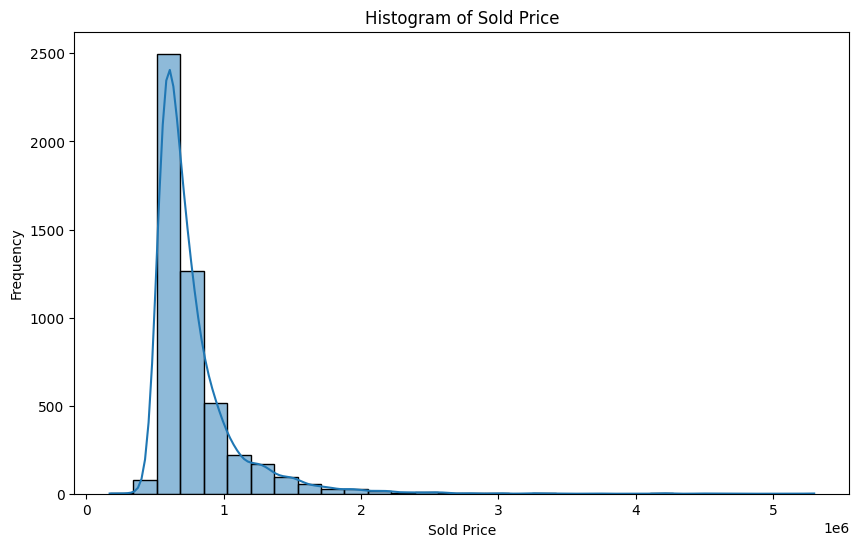

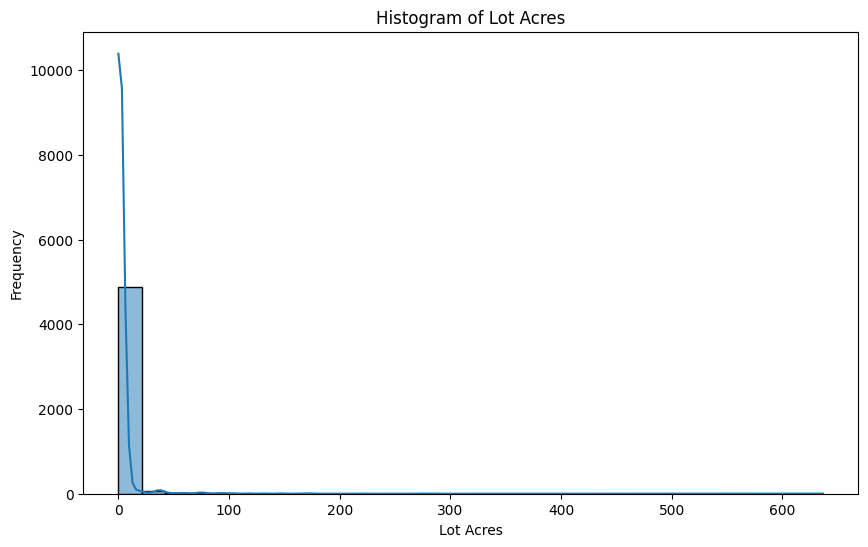

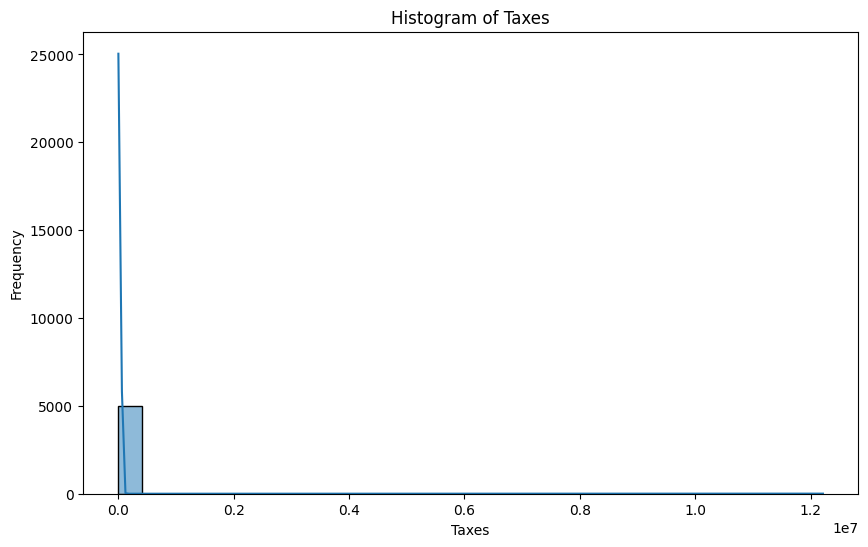

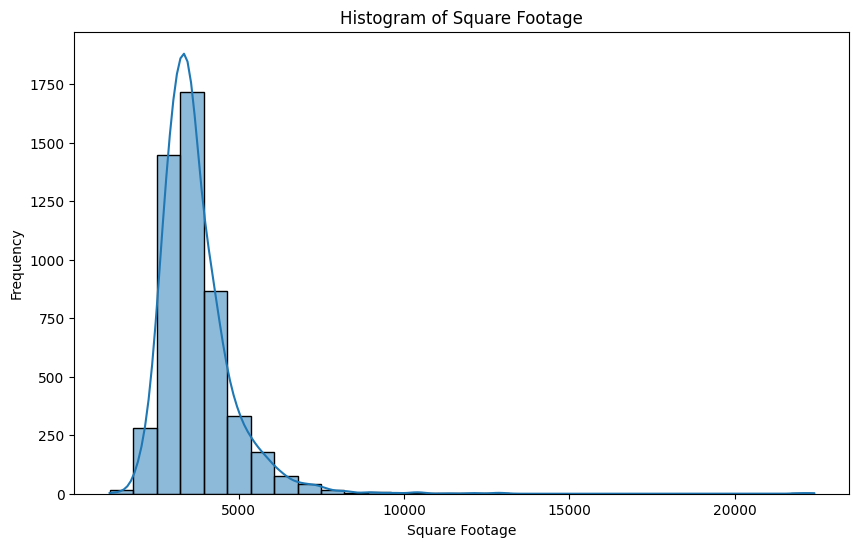

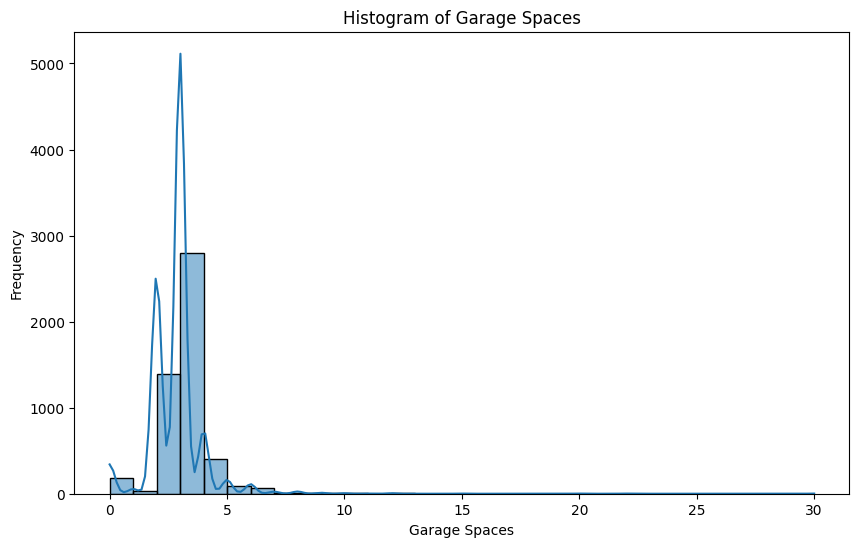

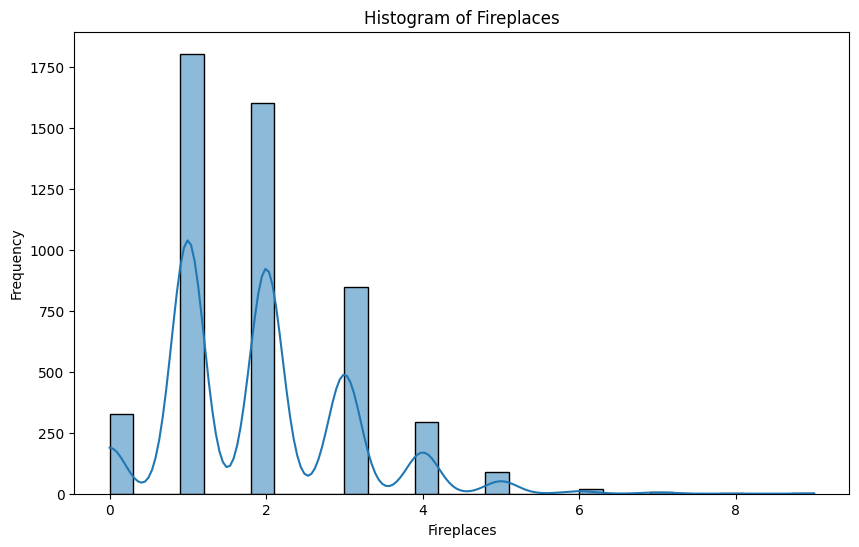

/usr/local/lib/python3.10/dist-packages/pandas/core/nanops.py:1010: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


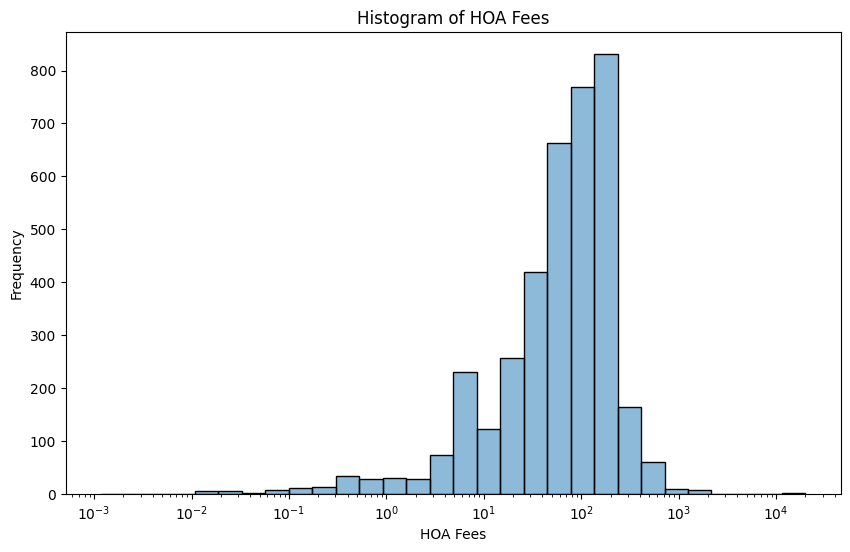

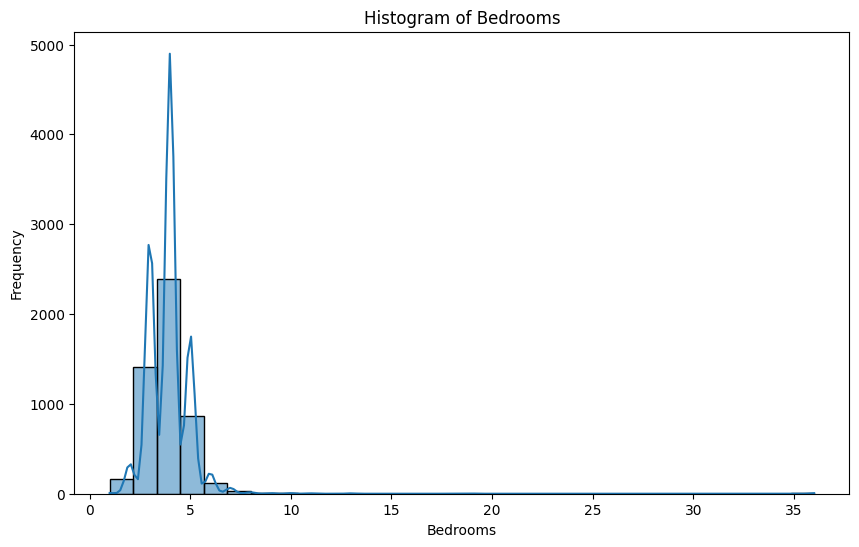

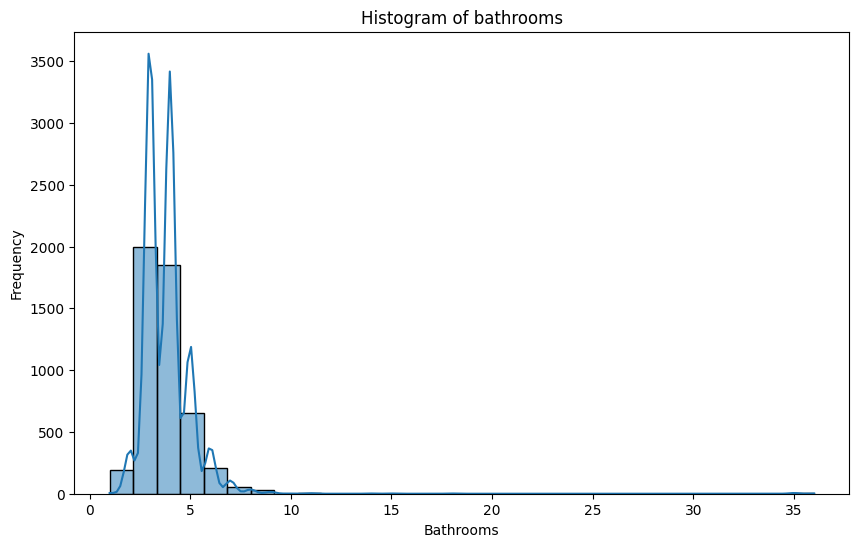

In [36]:
# This code creates histograms with kernel density estimates (KDE) for various features in the dataset.
# It visualizes the distribution of sold price, lot acres, taxes, square footage, garage spaces, fireplaces, HOA fees,
# bedrooms, and bathrooms. Each plot is displayed with appropriate labels and titles, and the HOA fees histogram uses a logarithmic scale.


import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(house_data['sold_price'], bins=30, kde=True)
plt.title('Histogram of Sold Price')
plt.xlabel('Sold Price')
plt.ylabel('Frequency')
plt.show()


plt.figure(figsize=(10, 6))
sns.histplot(house_data['lot_acres'], bins=30, kde=True)
plt.title('Histogram of Lot Acres')
plt.xlabel('Lot Acres')
plt.ylabel('Frequency')
plt.show()


plt.figure(figsize=(10, 6))
sns.histplot(house_data['taxes'], bins=30, kde=True)
plt.title('Histogram of Taxes')
plt.xlabel('Taxes')
plt.ylabel('Frequency')
plt.show()


plt.figure(figsize=(10, 6))
sns.histplot(house_data['sqrt_ft'], bins=30, kde=True)
plt.title('Histogram of Square Footage')
plt.xlabel('Square Footage')
plt.ylabel('Frequency')
plt.show()


plt.figure(figsize=(10, 6))
sns.histplot(house_data['garage'], bins=30, kde=True)
plt.title('Histogram of Garage Spaces')
plt.xlabel('Garage Spaces')
plt.ylabel('Frequency')
plt.show()


plt.figure(figsize=(10, 6))
sns.histplot(house_data['fireplaces'], bins=30, kde=True)
plt.title('Histogram of Fireplaces')
plt.xlabel('Fireplaces')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(house_data['HOA'], bins=30, kde=True, log_scale= True)
plt.title('Histogram of HOA Fees')
plt.xlabel('HOA Fees')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(house_data['bedrooms'], bins=30, kde=True)
plt.title('Histogram of Bedrooms')
plt.xlabel('Bedrooms')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(house_data['bathrooms'], bins=30, kde=True)
plt.title('Histogram of bathrooms')
plt.xlabel('Bathrooms')
plt.ylabel('Frequency')
plt.show()


### General Observations:

* Sold Price:
The distribution is heavily right-skewed, with most properties having a sold price below USD1 million. A few properties have significantly higher prices, which may indicate the presence of luxury homes or outliers.
* Lot Acres:
The majority of properties have a small lot size, with the distribution being highly right-skewed. There are a few properties with very large lot sizes, up to 636 acres, which are extreme outliers.
* Taxes:
Similar to sold_price and lot_acres, the taxes feature is highly right-skewed, with most properties having relatively low taxes. There are a few properties with extremely high tax amounts, suggesting the presence of high-value properties or potential errors.
* Square Footage (sqrt_ft):
The distribution of square footage is also right-skewed, with most properties having between 2,000 and 5,000 square feet. There are some properties with very large square footage, indicating potentially luxurious or commercial properties.
* Garage Spaces:
The majority of properties have between 1 and 3 garage spaces, with a small number of properties having many more garage spaces, up to 30. This indicates that while most homes have typical garage space, there are some properties with significantly more.
* Fireplaces:
The distribution shows that most properties have 1 or 2 fireplaces. There are multiple peaks, indicating that some properties have a higher number of fireplaces, likely corresponding to luxury homes or outliers.
* HOA Fees:
The HOA fees distribution is right-skewed, with most fees concentrated around lower values. There are some higher values, but these are less common, suggesting that higher HOA fees are not typical.
* Bedrooms:
The distribution of bedrooms is centered around 3 to 4 bedrooms, with a sharp decline after 5. There are outliers with as many as 36 bedrooms, which could be indicative of special properties like mansions or commercial properties.
* Bathrooms:
Most properties have 2 to 4 bathrooms, with a few outliers having many more. The sharp decline after 4 bathrooms suggests that properties with more bathrooms are rare and could be considered luxury properties.

## Range of Data (detection of Outliers)
It is crucial to address outliers as they can significantly impact the results of our analysis and modeling. Outliers can distort relationships between features and lead to models that do not generalize well. Here's how we can systematically identify and handle outliers using box plots.

**Outlier Handling Strategy:**

1. Remove Outliers: If outliers are likely errors or extreme cases not representative of the general data, we can remove them.
2. Cap Outliers: Replace outlier values with the nearest non-outlier value (e.g., capping at the 1st and 99th percentile).
3. Transform Data: Apply transformations (e.g., log transformation) that reduce the impact of outliers.

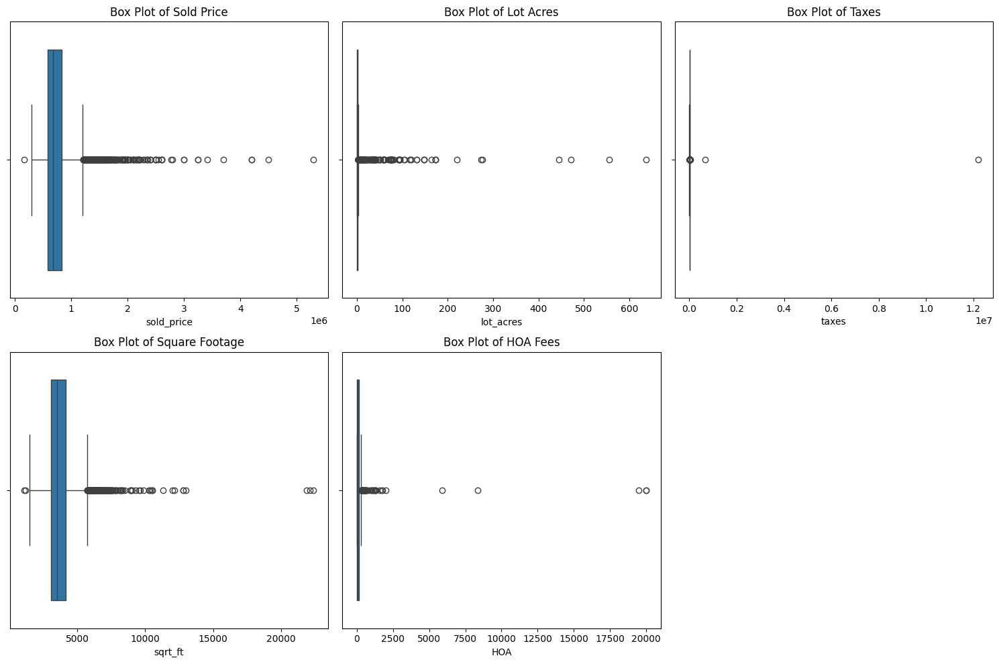

In [37]:
# This code creates a series of box plots to visualize the distribution and identify outliers for various features
# in the dataset, including sold price, lot acres, taxes, square footage, and HOA fees. The plots are arranged in
# a grid layout, and the display is adjusted to ensure everything fits neatly on the screen.


import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
sns.boxplot(x=house_data['sold_price'])
plt.title('Box Plot of Sold Price')

plt.subplot(2, 3, 2)
sns.boxplot(x=house_data['lot_acres'])
plt.title('Box Plot of Lot Acres')


plt.subplot(2, 3, 3)
sns.boxplot(x=house_data['taxes'])
plt.title('Box Plot of Taxes')

plt.subplot(2, 3, 4)
sns.boxplot(x=house_data['sqrt_ft'])
plt.title('Box Plot of Square Footage')


plt.subplot(2, 3, 5)
sns.boxplot(x=house_data['HOA'])
plt.title('Box Plot of HOA Fees')

plt.tight_layout()
plt.show()


1. Sold Price:
  * Observation: The box plot for sold_price shows a significant number of outliers on the higher end. These outliers are likely high-value properties (luxury homes) rather than errors.
  * Suggested Strategy: Log Transformation: Apply a log transformation to reduce skewness and minimize the impact of these outliers on the model.
2. Lot Acres:
  * Observation: The box plot for lot_acres indicates that there are a few properties with extremely large lots. While some of these might be valid (e.g., farms or estates), others could be errors or extreme outliers.
  * Suggested Strategy:
We will apply Log Transformation which will help normalize the data and reduce the effect of large values. We can also review and cap. Manually review the largest values. If they are valid but extreme, we will consider capping at the 99th percentile. For lot acres, we will apply capping.
3. Taxes:
  * Observation: The taxes feature shows outliers that are extremely high. This could indicate high-value properties or potential data entry errors.
  * Suggested Strategy: We will manaully review the Taxes over a certain threshold (e.g., more than a reasonable percentage of sold_price) should be manually reviewed. If they are errors, they should be corrected or removed. In our case, we detected errors which will be resolved such as mis placement of decimal points.
4. Square Footage (sqrt_ft):
  * Observation: The box plot for sqrt_ft shows a number of outliers, particularly in very large properties. These could represent mansions or commercial properties.
  * Suggested Strategy:We will Cap the square footage at a reasonable maximum (e.g., the 99th percentile) if the focus is on typical residential properties.
5. HOA Fees:
  * Observation: There are extreme outliers in HOA fees, with some properties having very high fees. This could be valid for certain communities but could also indicate data entry errors.
  * Suggested Strategy: If HOA fees exceed a certain threshold, we consider capping them or manually reviewing the data to ensure they are accurate.

In [38]:
problematic_taxes = house_data[house_data['taxes'] > 40000]
print("Problematic Taxes Values:\n", problematic_taxes[['MLS', 'taxes']])

Problematic Taxes Values:
            MLS       taxes
715   21700546  12215075.0
1135  21829815    668059.0


In [39]:
house_data.loc[house_data['MLS'] == 21700546, 'taxes'] = 12215.075
house_data.loc[house_data['MLS'] == 21829815, 'taxes'] = 6680.59

In [40]:
# This code applies a logarithmic transformation to the sold price and lot acres to reduce skewness.
# It then defines a function to cap outliers in specified columns by setting values outside the 1st and 99th percentiles
# to these percentile values. The function is applied to the square footage and HOA columns to handle outliers.


house_data['sold_price_log'] = np.log1p(house_data['sold_price'])
house_data['lot_acres_log'] = np.log1p(house_data['lot_acres'])

def cap_outliers(df, column):
    lower_cap = df[column].quantile(0.01)
    upper_cap = df[column].quantile(0.99)
    df[column] = np.clip(df[column], lower_cap, upper_cap)
    return df

house_data = cap_outliers(house_data, 'sqrt_ft')
house_data = cap_outliers(house_data, 'HOA')


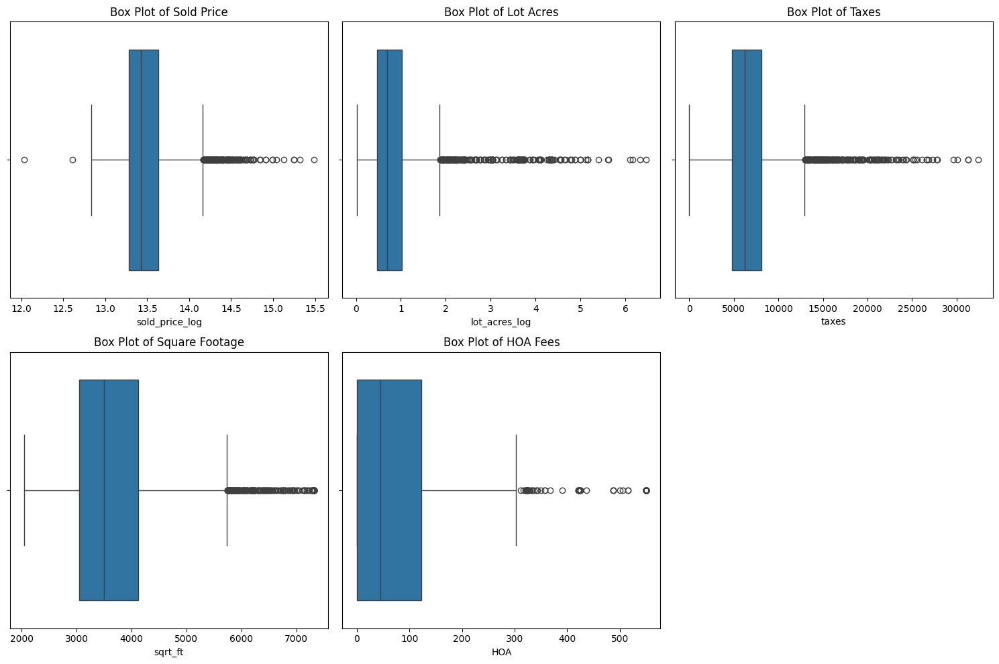

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
sns.boxplot(x=house_data['sold_price_log'])
plt.title('Box Plot of Sold Price')

plt.subplot(2, 3, 2)
sns.boxplot(x=house_data['lot_acres_log'])
plt.title('Box Plot of Lot Acres')

plt.subplot(2, 3, 3)
sns.boxplot(x=house_data['taxes'])
plt.title('Box Plot of Taxes')

plt.subplot(2, 3, 4)
sns.boxplot(x=house_data['sqrt_ft'])
plt.title('Box Plot of Square Footage')


plt.subplot(2, 3, 5)
sns.boxplot(x=house_data['HOA'])
plt.title('Box Plot of HOA Fees')

plt.tight_layout()
plt.show()


## Correlation Analysis
Now that we've addressed the outliers, we can move on to correlation analysis. This step will help us understand the relationships between the different features and identify any multicollinearity issues that might affect modeling.

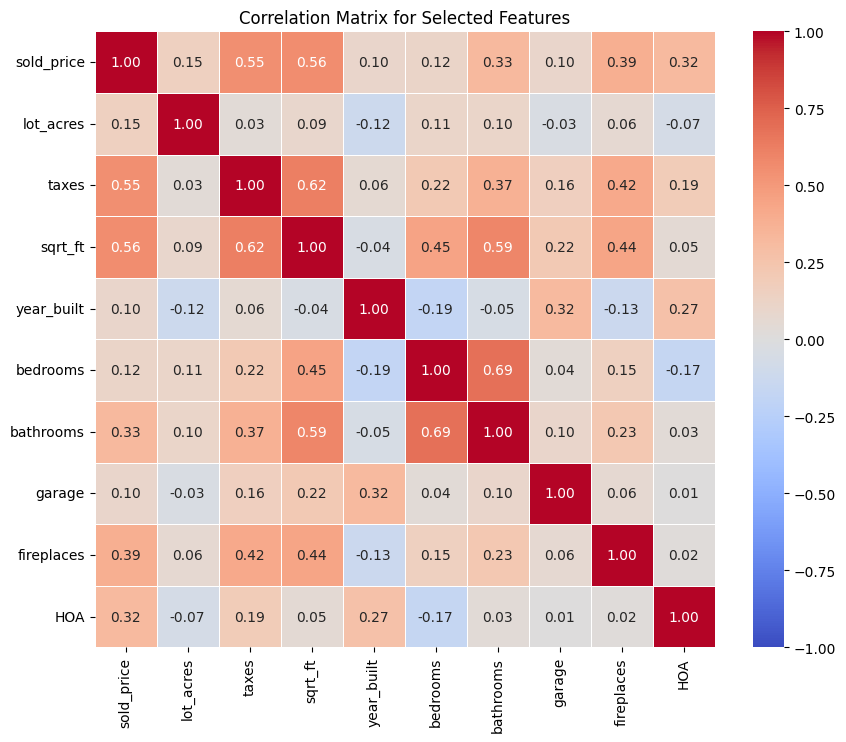

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

selected_columns = ['sold_price', 'lot_acres', 'taxes', 'sqrt_ft', 'year_built', 'bedrooms', 'bathrooms', 'garage', 'fireplaces', 'HOA']

correlation_matrix = house_data[selected_columns].corr()


plt.figure(figsize=(10, 8))

sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=.5)
plt.title('Correlation Matrix for Selected Features')
plt.show()


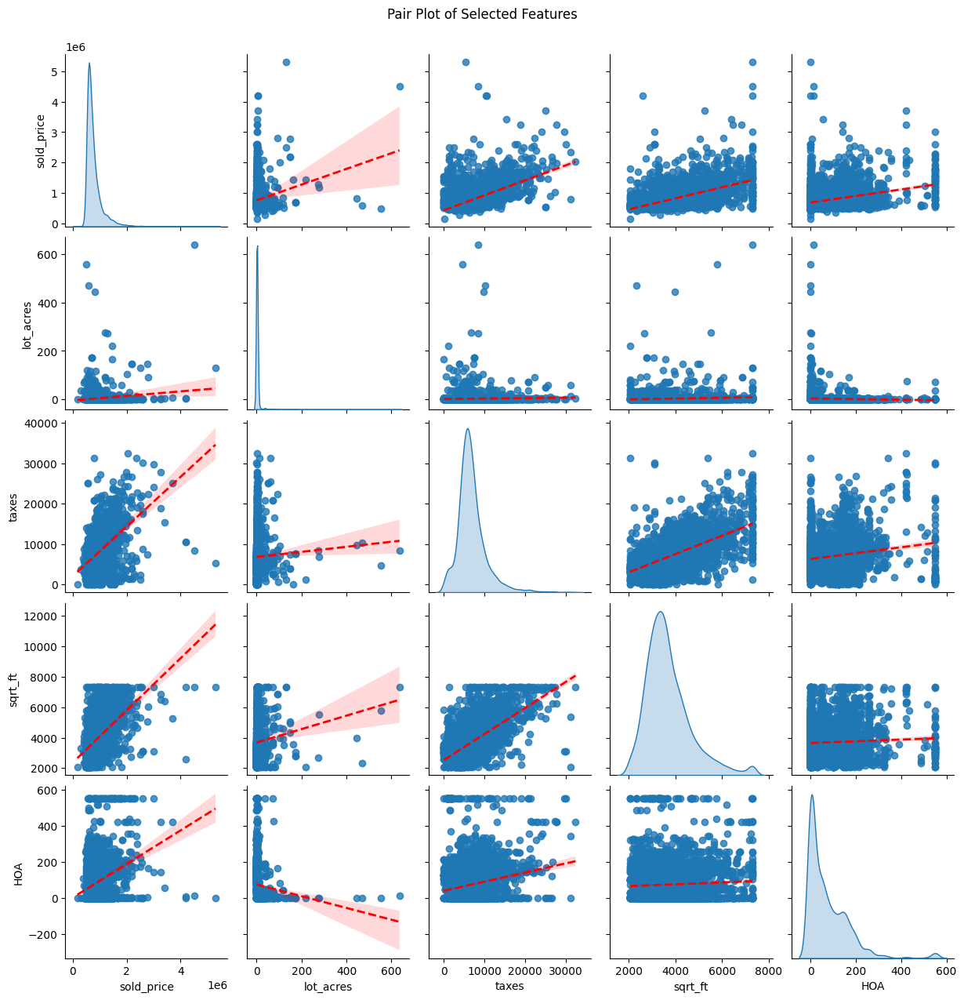

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

selected_columns = ['sold_price', 'lot_acres', 'taxes', 'sqrt_ft', 'HOA']

sns.pairplot(house_data[selected_columns], kind='reg', diag_kind='kde',
             plot_kws={'line_kws': {'color': 'red', 'linestyle': '--', 'linewidth': 2}
                       })
plt.suptitle('Pair Plot of Selected Features', y=1.02)
plt.show()


In [44]:
house_data['sold_price_category'] = pd.qcut(house_data['sold_price'], q=5, labels=['Low', 'Mid', 'Higher Mid', 'High', 'Luxury'])

house_data[['sold_price', 'sold_price_category']].head()

,sold_price,sold_price_category
0,5300000.0,Luxury
1,4200000.0,Luxury
2,4200000.0,Luxury
3,4500000.0,Luxury
4,3411450.0,Luxury


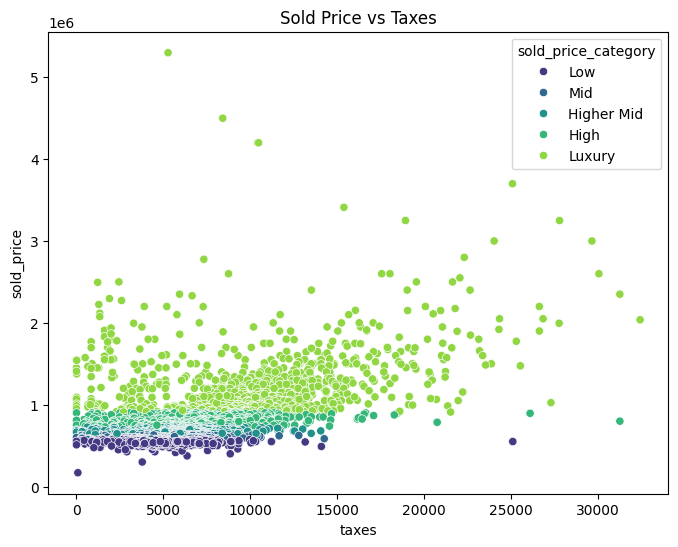

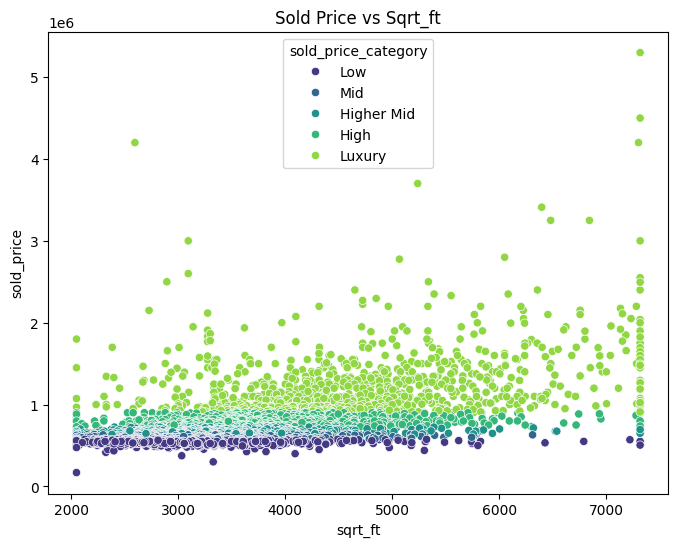

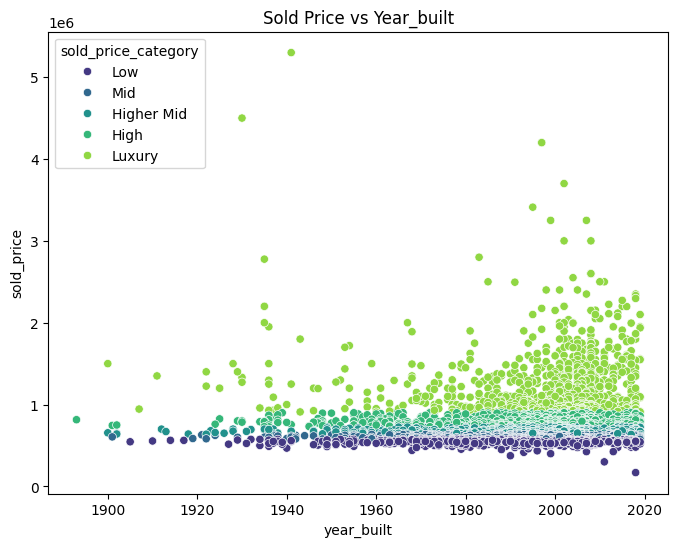

In [45]:

features_to_plot = ['taxes', 'sqrt_ft', 'year_built']

for feature in features_to_plot:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=house_data, x=feature, y='sold_price', hue='sold_price_category', palette='viridis')
    plt.title(f'Sold Price vs {feature.capitalize()}')
    plt.show()


### Analysis of the Correlation:
From the heatmap, here are some key insights:

1. Sold Price:
  * Strong Correlations:
sqrt_ft (0.56): As expected, the square footage of a house is strongly correlated with its selling price.
    * taxes (0.55): There is a strong correlation between taxes and sold price, which makes sense as more expensive properties tend to have higher taxes.
    * fireplaces (0.39): The number of fireplaces shows a moderate positive correlation with sold price, likely because more expensive homes often have more fireplaces.
  * Moderate Correlations:
    * bathrooms (0.33): The number of bathrooms also moderately correlates with the sold price, which is typical as larger or more expensive homes have more bathrooms.
    * HOA (0.32): HOA fees show a moderate correlation with sold price, indicating that properties with higher HOA fees may also have higher prices.

2. Bathrooms:
  * Strong Correlation with bedrooms (0.69): This indicates that homes with more bedrooms tend to have more bathrooms, which is expected.
  * Moderate Correlation with sqrt_ft (0.59): This shows that larger homes typically have more bathrooms.

3. Square Footage (sqrt_ft):
  * Strong Correlations:
taxes (0.62): Larger homes often incur higher taxes.
bathrooms (0.59): Larger homes typically have more bathrooms.
4. Potential Multicollinearity:
  * bedrooms and bathrooms (0.69): These features are strongly correlated, which could introduce multicollinearity in our model.
  * taxes and sqrt_ft (0.62): This strong correlation might also introduce multicollinearity.

5. Weaker Correlations:
  * garage, year_built, and lot_acres have weaker correlations with most other variables, indicating they might be less impactful in predicting sold_price.

6. Scatter Plots: The scatter plots reveal that higher sold prices for properties are generally associated with higher taxes, larger square footage, and newer construction years. While there are clear positive correlations in each case—properties with more square footage or newer construction tend to sell for more—there is significant overlap between different price categories, indicating that these factors alone do not fully determine property value. Other variables, such as location, amenities, and market conditions, likely contribute significantly to the variation in sold prices.

**Considerations for Model Development:**
In order to address Multicollinearity, we will consider removing one of the features in highly correlated pairs (e.g., bedrooms and bathrooms) if multicollinearity is a concern, or use techniques like PCA (Principal Component Analysis) or regularization methods in our modeling.

Alternatively, we could combine these features into a new composite feature if it makes sense contextually. (This is the decision which we have taken for this dataset and new feature is introduced already).

The Strong Predictors: Given their strong correlation with sold_price, sqrt_ft, taxes, bathrooms, and fireplaces should be key features in our predictive model.

Weaker Correlations: Features like garage and year_built may need further exploration or might not contribute significantly to the model and could potentially be excluded depending on your goals.

## Geospatial Analysis

We will perform a geographic analysis by creating an interactive map using the Folium library to visualize data points based on specific features such as price, taxes, or other relevant metrics. The map centers on the average geographic coordinates (latitude and longitude) of the dataset and utilizes marker clustering to efficiently manage and display numerous data points. Each location is represented by a colored circle marker, where the color is determined by a specified variable's range, such as pricing tiers. Clicking on a marker reveals additional information about that point, such as the exact value of the feature being analyzed. The resulting map is saved as an HTML file, making it easy to explore and interpret the spatial distribution of the analyzed feature across the geographic area.

In [46]:
zipcode_mapping_path = '/content/drive/MyDrive/zipcode_mapping.csv'
zipcode_mapping = pd.read_csv(zipcode_mapping_path)

zipcode_mapping.head()


,zip,lat,lng,city,state_id,state_name,county_name,county_names_all
0,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,Adjuntas,Adjuntas|Utuado
1,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,Aguada,Aguada
2,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,Aguadilla,Aguadilla|Moca
3,606,18.16585,-66.93716,Maricao,PR,Puerto Rico,Maricao,Maricao|Yauco|Sabana Grande
4,610,18.29110,-67.12243,Anasco,PR,Puerto Rico,Añasco,Añasco|Moca|Las Marías|Aguada


In [47]:
# This code converts the 'zip' column in the zipcode_mapping dataset and the 'zipcode' column in the house_data dataset to strings,
# then merges these datasets based on the zipcode. The merge adds city and state information to the house data,
# with the resulting data stored in 'merged_data'. Finally, it displays the first few rows of the merged data.

zipcode_mapping['zip'] = zipcode_mapping['zip'].astype(str)
house_data['zipcode'] = house_data['zipcode'].astype(str)


merged_data = pd.merge(house_data, zipcode_mapping[['zip', 'city', 'state_id']], left_on='zipcode', right_on='zip', how='left')


merged_data.head()


,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,...,floor_covering,HOA,sold_price_bin,total_bed_bath,sold_price_log,lot_acres_log,sold_price_category,zip,city,state_id
0,21530491,5300000.0,85637,-110.378200,31.356362,131.00,5272.00,1941,13,10.0,...,"Mexican Tile, Wood",0.000000,"(900000.0, 5300000.0]",23.0,15.483218,4.882802,Luxury,85637,Sonoita,AZ
1,21529082,4200000.0,85646,-111.045371,31.594213,4.68,10422.36,1997,2,2.0,...,"Natural Stone, Other",0.000000,"(900000.0, 5300000.0]",4.0,15.250595,1.736951,Luxury,85646,Tubac,AZ
2,3054672,4200000.0,85646,-111.040707,31.594844,4.68,10482.00,1997,2,3.0,...,"Natural Stone, Other: Rock",10.753904,"(900000.0, 5300000.0]",5.0,15.250595,1.736951,Luxury,85646,Tubac,AZ
3,21919321,4500000.0,85646,-111.035925,31.645878,636.67,8418.58,1930,7,5.0,...,"Ceramic Tile, Laminate, Wood",11.695749,"(900000.0, 5300000.0]",12.0,15.319588,6.457821,Luxury,85646,Tubac,AZ
4,21306357,3411450.0,85750,-110.813768,32.285162,3.21,15393.00,1995,4,6.0,...,"Carpet, Concrete",55.000000,"(900000.0, 5300000.0]",10.0,15.042648,1.437463,Luxury,85750,Tucson,AZ


In [48]:

top_areas_by_properties = merged_data.groupby(['city', 'sold_price_category']).size().unstack(fill_value=0)
top_areas_by_sales_value = merged_data.groupby(['city', 'sold_price_category'])['sold_price'].sum().unstack(fill_value=0)


top_areas_by_properties_sorted = top_areas_by_properties.sort_values(by='Luxury', ascending=False).head(10)
top_areas_by_sales_value_sorted = top_areas_by_sales_value.sort_values(by='Luxury', ascending=False).head(10)

top_areas_by_properties_sorted


<ipython-input-48-b4b42a110bba>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  top_areas_by_properties = merged_data.groupby(['city', 'sold_price_category']).size().unstack(fill_value=0)
<ipython-input-48-b4b42a110bba>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  top_areas_by_sales_value = merged_data.groupby(['city', 'sold_price_category'])['sold_price'].sum().unstack(fill_value=0)


sold_price_category,Low,Mid,Higher Mid,High,Luxury
city,,,,,
Tucson,904,799,878,962,807
Marana,51,31,51,41,114
Tubac,21,12,12,6,10
Vail,25,16,14,6,7
Sonoita,11,10,1,0,5
Tumacacori,0,0,0,0,4
Patagonia,4,2,0,1,3
Elgin,2,3,1,1,2
Green Valley,28,28,17,5,1


In [49]:
# This code creates an interactive map using Folium to visualize properties based on their sold price categories.
# It defines a function to assign colors to different price bins, sets up a map centered on the average latitude and longitude,
# and adds a marker cluster to manage the display of numerous data points. Each property is represented as a circle marker
# on the map, with the color indicating its price category and a popup showing details like the city, price bin, and sold price.
# Finally, the map is saved as an HTML file for viewing.


import folium
from folium.plugins import MarkerCluster

def get_color(price_bin):
    if price_bin == 'Low':
        return 'green'
    elif price_bin == 'Mid':
        return 'yellow'
    elif price_bin == 'Higher Mid':
        return 'orange'
    elif price_bin == 'High':
        return 'red'
    elif price_bin == 'Luxury':
        return 'dark red'
    else:
        return 'gray'


map_center = [merged_data['latitude'].mean(), merged_data['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

for idx, row in merged_data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=get_color(row['sold_price_category']),
        fill=True,
        fill_opacity=0.7,
        popup=folium.Popup(f"City: {row['city']}<br>Price Bin: {row['sold_price_category']}<br>Sold Price: ${row['sold_price']:,.2f}"),
    ).add_to(marker_cluster)

m.save("house_prices_map_by_City_Sold_Price_Bins.html")

m


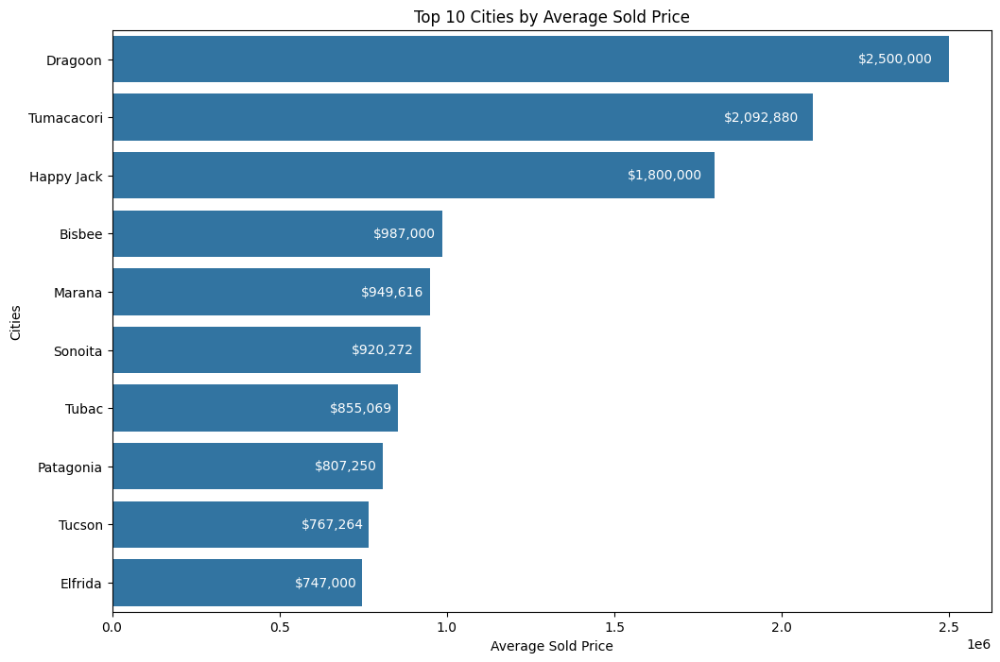

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt


region_data = merged_data.groupby('city').agg(
    avg_sold_price=('sold_price', 'mean'),
    median_sold_price=('sold_price', 'median'),
    count_sales=('sold_price', 'count')
).reset_index()


region_data = region_data.sort_values(by='avg_sold_price', ascending=False)


plt.figure(figsize=(12, 8))
ax = sns.barplot(x='avg_sold_price', y='city', data=region_data.head(10))


for index, value in enumerate(region_data.head(10)['avg_sold_price']):
    ax.text(value - value * 0.02, index, f'${value:,.0f}', color='white', ha="right", va="center")

plt.title('Top 10 Cities by Average Sold Price')
plt.xlabel('Average Sold Price')
plt.ylabel('Cities')
plt.show()


In [51]:
merged_data.to_csv('House_Data_Cleaned.csv', index=False)

In [52]:
merged_data.shape

(5000, 24)

In [53]:
merged_data.columns

Index(['MLS', 'sold_price', 'zipcode', 'longitude', 'latitude', 'lot_acres',
       'taxes', 'year_built', 'bedrooms', 'bathrooms', 'sqrt_ft', 'garage',
       'kitchen_features', 'fireplaces', 'floor_covering', 'HOA',
       'sold_price_bin', 'total_bed_bath', 'sold_price_log', 'lot_acres_log',
       'sold_price_category', 'zip', 'city', 'state_id'],
      dtype='object')